In [ ]:
# -*- coding: utf-8 -*-
"""
Created on 10/01, 2022
@author: Willy Fang
"""

# Import Libraries

In [1]:
import pandas as pd
import numpy as np
from glob import glob
import math
import os
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 1000)
import cv2
import pytesseract
from pdf2image import convert_from_path  # Faster way if using Anaconda: conda install -c conda-forge poppler
# import PyPDF2
# from PyPDF2 import PdfFileReader
# from PIL import Image
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings("ignore")
# pytesseract.pytesseract.tesseract_cmd = r'\Tesseract-OCR\tesseract.exe'
pytesseract.pytesseract.tesseract_cmd = r'D:\Tesseract-OCR\tesseract.exe'

# Convert PDFs to Images (JPGs)

In [2]:
for pdf_file in glob("*.pdf"):
    folder_name = pdf_file.split(".")[0]
    if not os.path.isdir(folder_name):
        os.mkdir(folder_name)

    print("Converting "+pdf_file+"......")
    pages = convert_from_path(pdf_file, dpi=400)
    print("Converting "+pdf_file+" Done!")
    
    print("Saving Images of "+pdf_file+"......")
    for ind, page in enumerate(pages):
        page.save(folder_name+'/Page_'+str(ind+1)+'.jpg', 'JPEG')
    print("Saving Images of "+pdf_file+" Done!")
    print()

Converting Certificate of Degree.pdf......
Converting Certificate of Degree.pdf Done!
Saving Images of Certificate of Degree.pdf......
Saving Images of Certificate of Degree.pdf Done!

Converting Certificate of Degree_Marked.pdf......
Converting Certificate of Degree_Marked.pdf Done!
Saving Images of Certificate of Degree_Marked.pdf......
Saving Images of Certificate of Degree_Marked.pdf Done!

Converting Transcripts.pdf......
Converting Transcripts.pdf Done!
Saving Images of Transcripts.pdf......
Saving Images of Transcripts.pdf Done!



# Text Recognition V01

In [3]:
# ### Pre-Processing
# # def get_cv2_img1(img_path):
# #     img = cv2.imread(img_path)
# #     gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # COLOR_BGR2GRAY、COLOR_BGR2HSV
# #     img_blur = cv2.GaussianBlur(gray, (3,3), 0)
# #     _,thresh = cv2.threshold(img_blur, 200, 255, cv2.THRESH_BINARY_INV)
# #     return [img, gray, img_blur, thresh]

# ### Pre-Processing
# def get_cv2_img1(img_path):
#     img = cv2.imdecode(np.fromfile(img_path,dtype=np.uint8),-1)[100:1700, 50:2550-50]
#     img_gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY) # COLOR_BGR2GRAY
#     return img_gray

# ### Text Data Processing
# def remove_space(x):
#     if x.strip() == "" or x.strip() == "nan":
#         return np.nan
#     else:
#         return x

# ### Read Text from Image
# def image_recognition1(img_path):
#     text = pytesseract.image_to_data(get_cv2_img1(img_path), lang='eng', output_type="data.frame")
#     text["text"] = text["text"].astype(str).apply(lambda x: remove_space(x))
#     text = text.dropna(how="any").reset_index(drop=True)
#     text["text"] = text["text"].apply(lambda x: x.replace(",","").replace(":",""))
#     return text

In [4]:
# for i in [1, 2, 3, 4]:
#     if not os.path.isdir('kickoff_'+str(i)+"_Edit/JPG/Converted"):
#         os.mkdir('kickoff_'+str(i)+"_Edit/JPG/Converted")
#     print("Image recognition "+str(i)+"......")
#     for image_path in glob('kickoff_'+str(i)+"_Edit/JPG/*.jpg"):
#         image_recog_df = image_recognition1(image_path)
#         df_name = image_path.split(".")[0].split("\\")[-1]
#         image_recog_df.to_excel('kickoff_'+str(i)+"_Edit/JPG/Converted/"+df_name+".xlsx", index=False)
#     print("Image recognition "+str(i)+" Done!")

# Text Recognition V02

In [5]:
### Image Pre-Processing: Load & Transform Images
def get_cv2_img2(img_path, method_num=1):
#     img = cv2.imdecode(np.fromfile(img_path, dtype=np.uint8),-1)[100:1700, 50:2550-50]
    img = cv2.imread(img_path)
    if method_num == 0: # Method 0: Original Image
        return img
    
    img_gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    if method_num == 1: # Method 1: Gray Scaling
        return img_gray
    
    elif method_num == 2: # Method 2: Gray Scaling & Binary Thresholding
        ret, img_gray = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY)
        return img_gray
    
    elif method_num == 3: # Method 3: Gray Scaling & Inverse Binary Thresholding
        ret, img_gray = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY_INV)
        return img_gray
    
    elif method_num == 4: # Method 4: Gray Scaling & Increase brightness & Increase Contrast (Adjust 1)
        img_gray = modify_contrast_and_brightness1(img_gray, brightness=45, contrast=35)
        return img_gray
    
    elif method_num == 5: # Method 5: Gray Scaling & Increase brightness & Increase Contrast (Adjust 2)
        img_gray = modify_contrast_and_brightness1(img_gray, brightness=25, contrast=50)
        return img_gray

    elif method_num == 6: # Method 6: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1)
        img_gray = modify_contrast_and_brightness1(img_gray, brightness=-35, contrast=60)
        return img_gray

    elif method_num == 7: # Method 7: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1) + Binary Thresholding
        img_gray = modify_contrast_and_brightness1(img_gray, brightness=-35, contrast=60)
        ret, img_gray = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY)
        return img_gray


### Image Pre-Processing: Modify Contrast and Brightness of Images (if necessary)
def modify_contrast_and_brightness1(img, brightness=25, contrast=25):
#     brightness = +25  # + Increase Brightness / - Reduce Brightness
#     contrast = +25  # + Increase Contrast / - Reduce Contrast
    B = brightness / 255.0
    c = contrast / 255.0 
    k = math.tan((45 + 44 * c) / 180 * math.pi)
    img = (img - 127.5 * (1 - B)) * k + 127.5 * (1 + B)
#     The values have to be in range 0~255. If values>255 then values=255, If values<0 then values=0
    img = np.clip(img, 0, 255).astype(np.uint8)
    return img


def remove_space(x):
    if x.strip() == "":
        return np.nan
    else:
        return x


### Text Recognition: Read Text and Process Data
def text_recognition2(img_path, n=1):
    text = pytesseract.image_to_data(get_cv2_img2(img_path, method_num=n), lang="eng+chi_tra", output_type="data.frame")
    text["text"] = text["text"].astype(str).apply(lambda x: remove_space(x))
    text = text.dropna(how="any")
#     text["text"] = text["text"].apply(lambda x: x.replace(",","").replace(":","").strip("_").strip("—"))
    text = text[text["text"]!=""]
    text = text[text["conf"]!=-1]
    text = text[text["text"]!="|"].reset_index(drop=True)
    return text.drop_duplicates(keep='last')


# def text_recognition_data_transform1(text):
#     return text.drop_duplicates(keep='last')


def text_recognition_data_to_txt1(text):
    text_string = ""
    for i in set(text["block_num"]):
        for j in set(text["line_num"]):
            if len(text[(text["block_num"]==i) & (text["line_num"]==j)]) == 0:
                continue
            text_string += text[(text["block_num"]==i) & 
                                (text["line_num"]==j)]["text"].str.cat(sep=' ') + "\n\n"
    return text_string.strip()


# def text_recognition_choose_best1(text_list):
#     text_list = [text for text in text_list if len(text)!=0]
#     best_conf = -0.0001
#     best_text = pd.DataFrame()
#     for text in text_list:
#         text_conf = np.mean(text[(text["width"]>200) & (text["width"]<350)]["conf"])
#         if text_conf>best_conf:
#             best_conf = text_conf
#             best_text = text
#     if len(best_text)==0:
#         for text in text_list:
#             text_conf = np.mean(text[(text["width"]>150) & (text["width"]<350)]["conf"])
#             if text_conf>best_conf:
#                 best_conf = text_conf
#                 best_text = text
#     return best_text

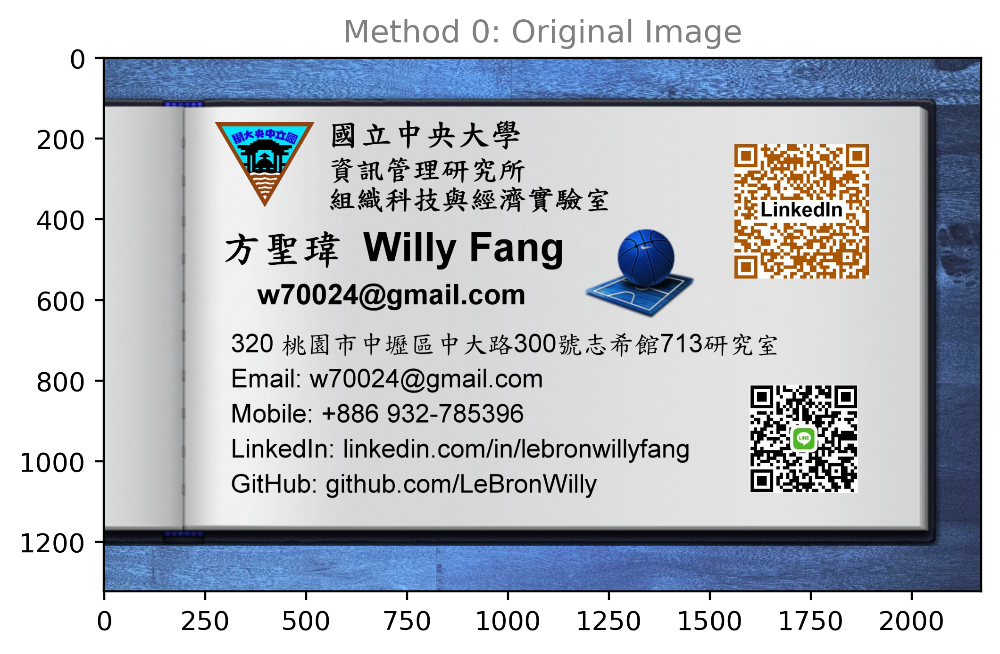

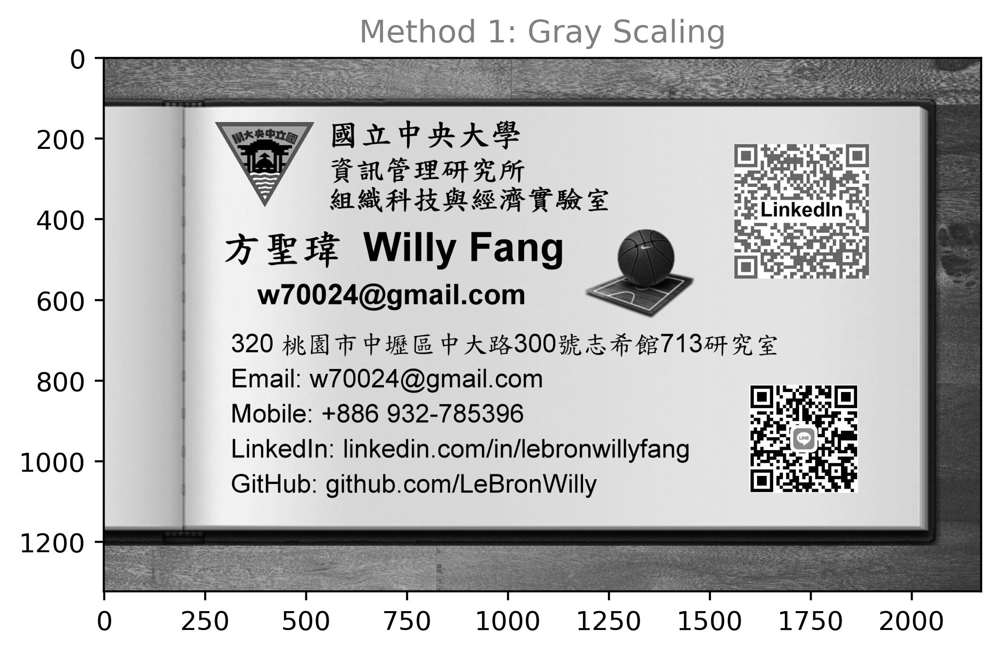

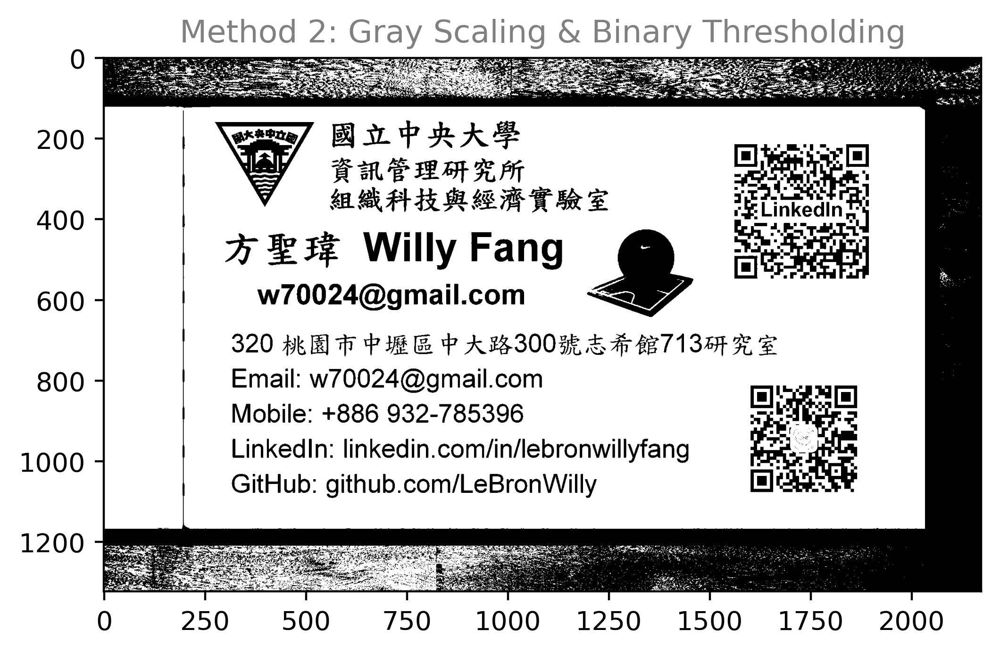

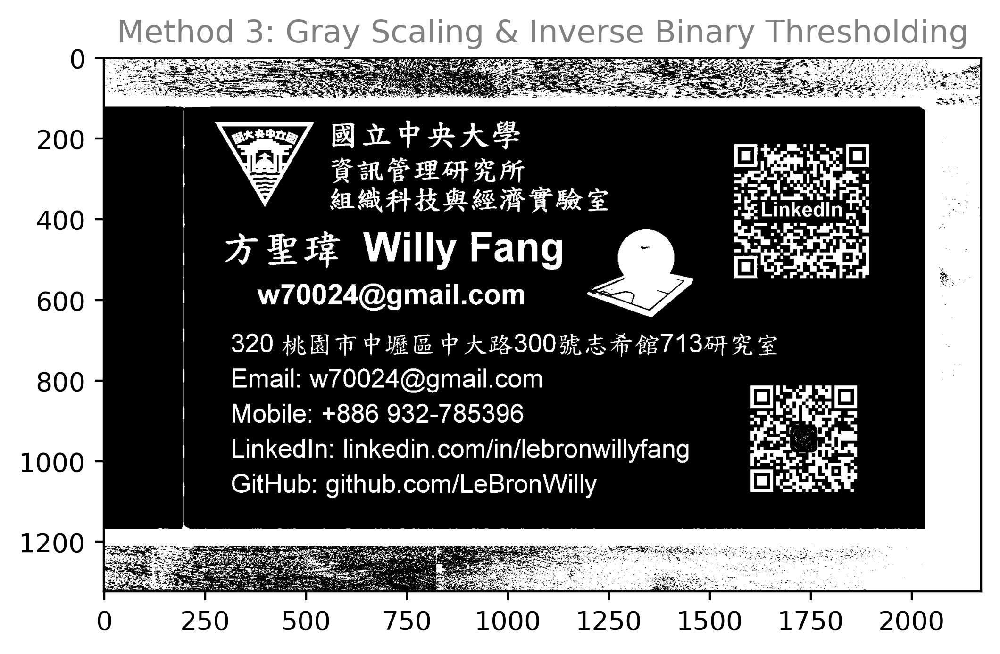

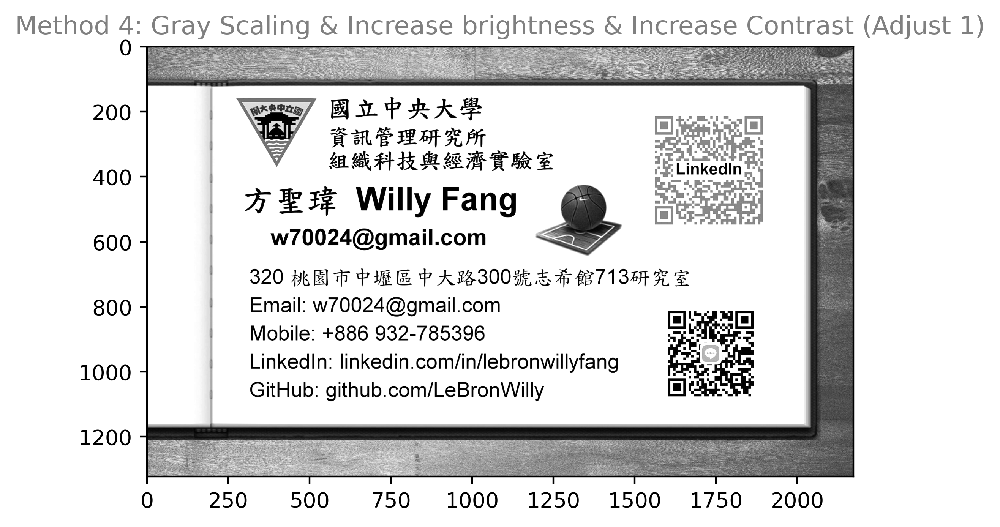

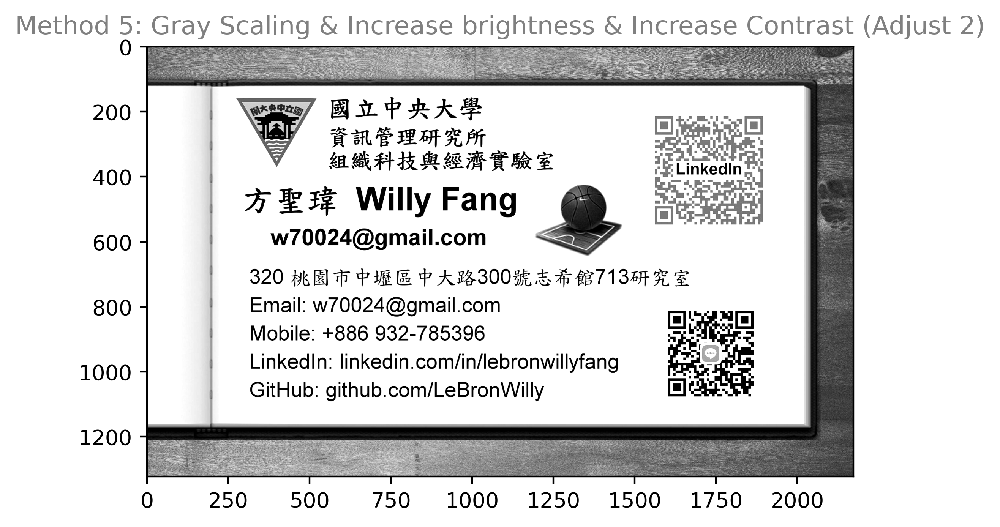

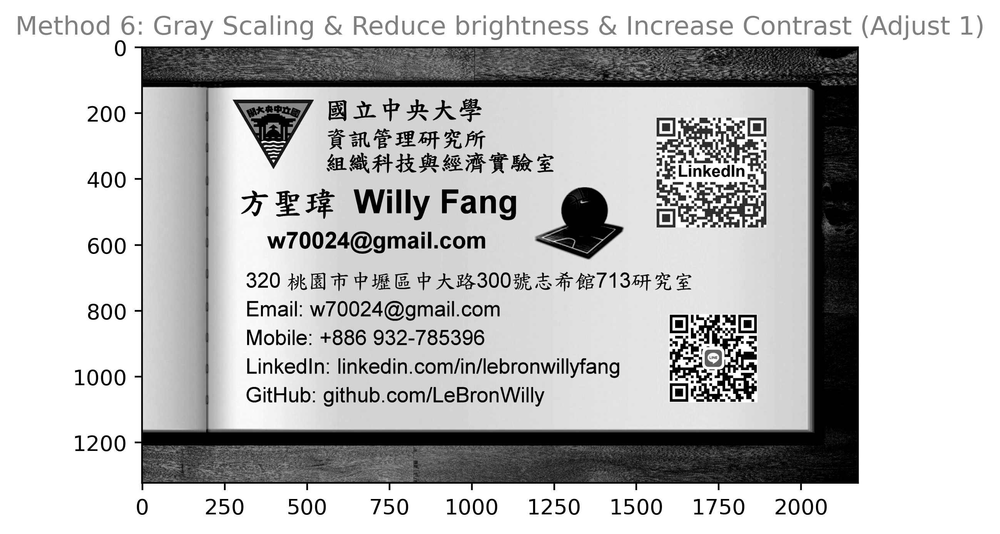

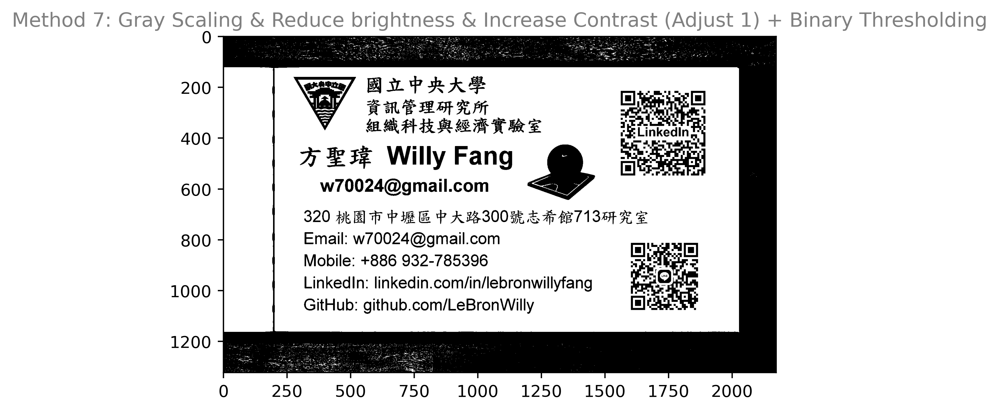

In [6]:
# tmp_path = "Transcripts\Page_1.jpg"
# tmp_path = "Certificate of Degree_Marked\Page_1.jpg"
tmp_path = "Name Card\Personal Name Card.jpg"

plt.figure(dpi=400)
plt.title('Method 0: Original Image', color= 'gray')
plt.imshow(get_cv2_img2(tmp_path,0), cmap="gray")
plt.figure(dpi=400)
plt.title('Method 1: Gray Scaling', color= 'gray')
plt.imshow(get_cv2_img2(tmp_path,1), cmap="gray")
plt.figure(dpi=400)
plt.title('Method 2: Gray Scaling & Binary Thresholding', color= 'gray')
plt.imshow(get_cv2_img2(tmp_path,2), cmap="gray")
plt.figure(dpi=400)
plt.title('Method 3: Gray Scaling & Inverse Binary Thresholding', color= 'gray')
plt.imshow(get_cv2_img2(tmp_path,3), cmap="gray")
plt.figure(dpi=400)
plt.title('Method 4: Gray Scaling & Increase brightness & Increase Contrast (Adjust 1)', color= 'gray')
plt.imshow(get_cv2_img2(tmp_path,4), cmap="gray")
plt.figure(dpi=400)
plt.title('Method 5: Gray Scaling & Increase brightness & Increase Contrast (Adjust 2)', color= 'gray')
plt.imshow(get_cv2_img2(tmp_path,5), cmap="gray")
plt.figure(dpi=400)
plt.title('Method 6: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1)', color= 'gray')
plt.imshow(get_cv2_img2(tmp_path,6), cmap="gray")
plt.figure(dpi=400)
plt.title('Method 7: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1) + Binary Thresholding', color= 'gray')
plt.imshow(get_cv2_img2(tmp_path,7), cmap="gray")

In [7]:
t = []
for i in range(0,7+1,1):
    t.append(text_recognition2(tmp_path,i))

In [8]:
# Methods' Conf Compared
# Method 0: Original Image
# Method 1: Gray Scaling
# Method 2: Gray Scaling & Binary Thresholding
# Method 3: Gray Scaling & Inverse Binary Thresholding
# Method 4: Gray Scaling & Increase brightness & Increase Contrast (Adjust 1)
# Method 5: Gray Scaling & Increase brightness & Increase Contrast (Adjust 2)
# Method 6: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1)
# Method 7: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1) + Binary Thresholding
for i, tt in enumerate(t):
    try:
#         print("Method "+str(i)+": ", np.round(np.mean(tt[(tt["width"]>200) & (tt["width"]<350)]["conf"]), 2))
#         print("Method "+str(i)+": ", np.round(np.mean(tt[(tt["width"]>100) & (tt["width"]<350)]["conf"]), 2))
        print("Method "+str(i)+": ", np.round(np.mean(tt["conf"]), 2))
    except:
        print("Method "+str(i)+": Not a good method for this image")

Method 0:  87.9
Method 1:  78.51
Method 2:  82.54
Method 3:  82.88
Method 4:  82.89
Method 5:  81.21
Method 6:  80.94
Method 7:  88.47


In [9]:
# Method 0: Original Image
print(text_recognition_data_to_txt1(t[0]))
t[0]

國 立 中 央 大 學

資訊 管理 研究 所

組 織 科技 與 經 濟 實 驗 室

Fy ¥ 3 Willy Fang

w70024@gmail.com Se

SS

320 桃園 市 中 壢 區 中 大 路 300 號 志 希 館 713 研 究 室 Mobile: +886 932-785396 LinkedIn: linkedin.com/in/lebronwillyfang

Email: w70024@gmail.com GitHub: github.com/LeBronWilly


,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,5,1,3,1,1,1,566,161,55,64,93.119171,國
1,5,1,3,1,1,2,673,164,37,54,92.251297,立
2,5,1,3,1,1,3,745,156,38,70,89.234756,中
3,5,1,3,1,1,4,817,159,53,65,91.102585,央
4,5,1,3,1,1,5,895,161,58,62,91.719284,大
5,5,1,3,1,1,6,973,157,58,71,92.376961,學
6,5,1,3,1,2,1,564,248,169,63,95.109772,資訊
7,5,1,3,1,2,2,769,238,100,81,96.767067,管理
8,5,1,3,1,2,3,868,250,103,61,96.444290,研究
9,5,1,3,1,2,4,995,254,47,56,95.273926,所


In [10]:
# Method 1: Gray Scaling
print(text_recognition_data_to_txt1(t[1]))
t[1]

國 立 中 央 大 學

資訊 管理 研究 所

組 織 科 技 與 經 濟 實 驗 室

方 聖 璋 Willy Fang

w70024@gmail.com

320 桃園 市 中 壢 區 中 大 路 300 號 志 希 館 713 研 究 Mobile: +886 932-785396 LinkedIn: linkedin.com/in/lebronwillyfang

Email: w70024@gmail.com GitHub: github.com/LeBronWilly

Na

in

wad

回 =

oa act 1

“Linkedin

coe 2 Ra ratTt

See


,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,5,1,2,1,1,1,566,161,55,64,93.129257,國
1,5,1,2,1,1,2,673,164,37,54,92.242630,立
2,5,1,2,1,1,3,745,156,38,70,89.342110,中
3,5,1,2,1,1,4,817,159,53,65,90.990685,央
4,5,1,2,1,1,5,895,161,58,62,92.078209,大
5,5,1,2,1,1,6,973,157,58,71,93.184860,學
6,5,1,2,1,2,1,564,248,169,63,95.348991,資訊
7,5,1,2,1,2,2,769,254,105,57,96.804680,管理
8,5,1,2,1,2,3,873,239,98,81,96.582512,研究
9,5,1,2,1,2,4,995,253,47,57,96.331985,所


In [11]:
# Method 2: Gray Scaling & Binary Thresholding
print(text_recognition_data_to_txt1(t[2]))
t[2]

組 織 科技 與 經 濟 實驗 室 Setingcun

Fy ¥ 3¢ Willy Fang 人 的

w70024@gmail.com =

320 桃園 市 中 壢 區 中 大 路 300 號 志 希 館 713 研 究 室 Mobile: +886 932-785396 LinkedIn: linkedin.com/in/lebronwillyfang

Email: w70024@gmail.com GitHub: github.com/LeBronWilly


,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,5,1,2,1,1,2,560,325,61,53,93.269768,組
1,5,1,2,1,1,3,654,321,36,63,93.186340,織
2,5,1,2,1,1,4,720,324,113,59,96.175285,科技
3,5,1,2,1,1,5,864,322,72,60,95.145409,與
4,5,1,2,1,1,6,936,328,38,49,93.246628,經
5,5,1,2,1,1,7,1002,320,42,63,93.185394,濟
6,5,1,2,1,1,8,1074,320,112,64,93.231514,實驗
7,5,1,2,1,1,9,1212,324,37,57,92.544395,室
8,5,1,2,1,1,10,1562,305,266,113,0.000000,Setingcun
9,5,1,2,1,2,1,301,423,72,113,29.509575,Fy


In [12]:
# Method 3: Gray Scaling & Inverse Binary Thresholding
print(text_recognition_data_to_txt1(t[3]))
t[3]

組 織 科技 與 經 濟 實驗 室 Sein

Fy ¥ 3¢ Willy Fang Sea

w70024@gmail.com =

320 桃園 市 中 靂 區 中 大 路 300 號 志 希 館 713 研 究 室 Mobile: +886 932-785396 LinkedIn: linkedin.com/in/lebronwillyfang

Email: w70024@gmail.com GitHub: github.com/LeBronWilly


,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,5,1,2,1,1,2,560,325,61,53,93.269806,組
1,5,1,2,1,1,3,654,321,36,63,93.175560,織
2,5,1,2,1,1,4,720,324,113,59,96.174797,科技
3,5,1,2,1,1,5,864,322,72,60,95.311913,與
4,5,1,2,1,1,6,936,328,38,49,93.242531,經
5,5,1,2,1,1,7,1002,320,42,63,93.121330,濟
6,5,1,2,1,1,8,1074,320,112,64,93.223457,實驗
7,5,1,2,1,1,9,1212,324,37,57,92.547005,室
8,5,1,2,1,1,10,1562,288,330,146,0.000000,Sein
9,5,1,2,1,2,1,301,423,72,113,27.303719,Fy


In [13]:
# Method 4: Gray Scaling & Increase brightness & Increase Contrast (Adjust 1)
print(text_recognition_data_to_txt1(t[4]))
t[4]

國 立 中 央 大 學

資訊 管理 研究 所 eines

組 織 科技 與 經 濟 實驗 室 “Linkealn

% ¥ 3% Willy Fang aes

w70024@gmail.com SS

320 桃園 市 中 壢 區 中 大 路 300 號 志 希 館 713 研 究 室 Mobile: +886 932-785396 LinkedIn: linkedin.com/in/lebronwillyfang

Email: w70024@gmail.com GitHub: github.com/LeBronWilly


,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,5,1,3,1,1,1,566,161,55,64,92.645355,國
1,5,1,3,1,1,2,674,164,36,54,93.248138,立
2,5,1,3,1,1,3,744,156,39,70,82.357483,中
3,5,1,3,1,1,4,813,159,57,65,91.968414,央
4,5,1,3,1,1,5,892,161,61,62,91.982147,大
5,5,1,3,1,1,6,970,157,61,71,95.577652,學
6,5,1,5,1,1,1,564,248,128,63,84.297249,資訊
7,5,1,5,1,1,2,729,248,142,63,96.441040,管理
8,5,1,5,1,1,3,870,222,101,113,96.964439,研究
9,5,1,5,1,1,4,997,254,44,56,96.953987,所


In [14]:
# Method 5: Gray Scaling & Increase brightness & Increase Contrast (Adjust 2)
print(text_recognition_data_to_txt1(t[5]))
t[5]

國 立 中 央 大 學

fapaann amen

7 ¥ 3% Willy Fang a ee

w70024@gmail.com =

320 桃園 市 中 壢 區 中 大 路 300 號 志 希 館 713 研 究 室 Mobile: +886 932-785396 LinkedIn: linkedin.com/in/lebronwillyfang

Email: w70024@gmail.com GitHub: github.com/LeBronWilly


,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,5,1,3,1,1,1,566,161,55,64,93.144989,國
1,5,1,3,1,1,2,674,164,36,54,92.465363,立
2,5,1,3,1,1,3,743,156,40,70,92.109375,中
3,5,1,3,1,1,4,818,159,52,65,90.475189,央
4,5,1,3,1,1,5,893,161,60,62,92.543312,大
5,5,1,3,1,1,6,968,157,63,71,96.506279,學
6,5,1,5,1,1,1,564,248,472,63,0.000000,fapaann
7,5,1,5,1,1,2,1562,215,333,138,20.232742,amen
8,5,1,5,1,2,1,301,436,65,78,9.640762,7
9,5,1,5,1,2,2,424,436,41,79,72.758507,¥


In [15]:
# Method 6: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1)
print(text_recognition_data_to_txt1(t[6]))
t[6]

w70024@gmail.com

320 桃園 市 中 壢 區 中 大 路 300 號 志 希 館 713 研 究 室 Mobile: +886 932-785396 LinkedIn: linkedin.com/in/lebronwillyfang

Email: w70024@gmail.com GitHub: github.com/LeBronWilly

資訊 管理 研究 所 ces

組 織 科技 與 經 濟 實驗 室 下 ge 生

 ¥3¢ Willy Fang ae mes


,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,5,1,3,1,1,1,564,248,169,63,92.887505,資訊
1,5,1,3,1,1,2,768,206,100,120,95.814217,管理
2,5,1,3,1,1,3,867,249,104,62,96.822136,研究
3,5,1,3,1,1,4,995,253,45,57,96.936951,所
4,5,1,3,1,1,5,1562,211,336,170,12.965836,ces
5,5,1,6,1,1,1,560,325,62,53,93.148476,組
6,5,1,6,1,1,2,656,321,34,63,93.095818,織
7,5,1,6,1,1,3,718,324,115,59,68.416359,科技
8,5,1,6,1,1,4,866,321,70,61,90.950676,與
9,5,1,6,1,1,5,935,328,39,49,93.058662,經


In [16]:
# Method 7: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1) + Binary Thresholding
print(text_recognition_data_to_txt1(t[7]))
t[7]

組 織 科 技 與 經 濟 實 驗 室

7 #3 Willy Fang

w70024@gmail.com

320 桃園 市 中 靂 區 中 大 路 300 號 志 希 館 713 研 究 室

Email: w70024@gmail.com

Mobile: +886 932-785396

LinkedIn: linkedin.com/in/lebronwillyfang

GitHub: github.com/LeBronWilly


,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,5,1,3,1,1,1,560,325,62,53,93.022125,組
1,5,1,3,1,1,2,652,321,39,63,92.915260,織
2,5,1,3,1,1,3,717,324,45,59,92.333313,科
3,5,1,3,1,1,4,781,324,52,58,91.731392,技
4,5,1,3,1,1,5,867,321,35,61,92.865479,與
5,5,1,3,1,1,6,937,326,37,51,93.272690,經
6,5,1,3,1,1,7,1002,320,42,63,93.062820,濟
7,5,1,3,1,1,8,1077,320,35,64,92.554459,實
8,5,1,3,1,1,9,1141,323,46,56,92.551468,驗
9,5,1,3,1,1,10,1211,324,39,57,93.092651,室


In [17]:
# # for i in [5]:
# for i in range(1, 15+1):
#     if not os.path.isdir('kickoff_'+str(i)+"_Edit/JPG/Converted2_3"):
#         os.mkdir('kickoff_'+str(i)+"_Edit/JPG/Converted2_3")
#     print("Image recognition "+str(i)+"......")
    
#     with pd.ExcelWriter('kickoff_'+str(i)+"_Edit/JPG/Converted2_3/Kickoff_"+str(i)+".xlsx") as writer:
        
#         for image_path in glob('kickoff_'+str(i)+"_Edit/JPG/Unmarked/*.jpg"):
#             image_recog_df_list = [text_recognition_data_transform1(text_recognition2(image_path, 0)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 1)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 6)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 7))]
#             image_recog_df = image_recognition_choose_best1(image_recog_df_list)
#             with open('kickoff_'+str(i)+"_Edit/JPG/Converted2_3/"+image_path.split("\\")[-1].split(".")[0]+".txt", "w", encoding='UTF-8') as text_file:
#                 text_file.write(image_recognition_data_transform_text1(image_recog_df))
#             image_recog_df.to_excel(writer, sheet_name=image_path.split("\\")[-1].split(".")[0], index=False)
        
#         for image_path in glob('kickoff_'+str(i)+"_Edit/JPG/New/*.jpg"):
#             image_recog_df_list = [text_recognition_data_transform1(text_recognition2(image_path, 0)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 1)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 2)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 3)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 4)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 5)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 6)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 7))]
#             image_recog_df = image_recognition_choose_best1(image_recog_df_list)
#             with open('kickoff_'+str(i)+"_Edit/JPG/Converted2_3/"+image_path.split("\\")[-1].split(".")[0]+".txt", "w", encoding='UTF-8') as text_file:
#                 text_file.write(image_recognition_data_transform_text1(image_recog_df))
#             image_recog_df.to_excel(writer, sheet_name=image_path.split("\\")[-1].split(".")[0], index=False)
        
#         for image_path in glob('kickoff_'+str(i)+"_Edit/JPG/Marked/*.jpg"):
#             image_recog_df_list = [text_recognition_data_transform1(text_recognition2(image_path, 2)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 3)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 4)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 5)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 6)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 7))]
#             image_recog_df = image_recognition_choose_best1(image_recog_df_list)
#             with open('kickoff_'+str(i)+"_Edit/JPG/Converted2_3/"+image_path.split("\\")[-1].split(".")[0]+".txt", "w", encoding='UTF-8') as text_file:
#                 text_file.write(image_recognition_data_transform_text1(image_recog_df))
#             image_recog_df.to_excel(writer, sheet_name=image_path.split("\\")[-1].split(".")[0], index=False)
        
        
#     print("Image recognition "+str(i)+" Done!")

In [ ]:
# temp_string = ""
# for i in set(t[7]["block_num"]):
#     for j in set(t[7]["line_num"]):
#         temp_string += t[7][(t[7]["block_num"]==i) & (t[7]["line_num"]==j)]["text"].str.cat(sep=' ') + "\n"
# print(temp_string)

In [122]:
# 1.	level = 1/2/3/4/5，用於標注當前項的層級。
# 2.	page_num, level = 1;用於標注當前項所屬頁面。一般情況下，單張圖片的內容均會被分在同一個頁，且在tsv檔中只有第一行的level為1，當level=1時，left=0, top=0, width和height分別是圖片的實際寬度和高度。
# 3.	block_num, level = 2; Tesseract會將圖像分割為多個不同的block，block會出現1，2，3……等等值
# 4.	par_num, level = 3; 從Tessract的相關文檔來看，該參數應該是當前圖像中文字的段落分類，level=1/2/3時，該值為0；其他情況為1。
# 5.	line_num, level = 4; 一般均為1。
# 6.	word_num, level = 5;在同一行[line_num]中出現的單詞序號。
# 7.	left/top/width/height：當前項所在長方形區域的左上角，寬度，高度。
# 8.	conf，當前檢測字元的置信度，表示項無文字，值為-1；若Tesseract認為當前區域有文字，則其值得範圍為0~100。

# References

1. https://stackoverflow.com/questions/71442585/adjusting-pytesseract-parameters
2. https://ithelp.ithome.com.tw/articles/10210214
3. https://python-bloggers.com/2022/05/extract-text-from-image-using-python/
4. (tabula) https://aegis4048.github.io/parse-pdf-files-while-retaining-structure-with-tabula-py
5. https://stackoverflow.com/questions/34837707/how-to-extract-text-from-a-pdf-file
6. https://www.geeksforgeeks.org/extract-text-from-pdf-file-using-python/
7. https://towardsdatascience.com/how-to-extract-text-from-pdf-245482a96de7
8. https://towardsdatascience.com/extracting-text-from-scanned-pdf-using-pytesseract-open-cv-cd670ee38052
9. https://betterprogramming.pub/efficiently-convert-pdf-to-png-or-jpeg-images-in-python-50c5ce224c20
10. https://pdf.wondershare.com/pdf-knowledge/pdf-to-png-python.html
11. https://github.com/tesseract-ocr/tesseract
12. https://vimsky.com/zh-tw/examples/usage/python-opencv-cv2-cvtcolor-method.html
13. https://pdf2image.readthedocs.io/en/latest/reference.html
14. (Need Java) https://products.aspose.com/cells/python-java/conversion/jpg-to-excel/
15. https://ithelp.ithome.com.tw/articles/10245342
16. https://blog.csdn.net/hxxjxw/article/details/117961339
17. https://dotblogs.com.tw/CYLcode/2020/03/12/111420
18. https://ithelp.ithome.com.tw/users/20120424/ironman/3642
19. https://blog.gtwang.org/programming/opencv-drawing-functions-tutorial/
20. https://splunktool.com/pandas-dataframe-select-multiple-discontinuous-columnsslices
21. https://ithelp.ithome.com.tw/articles/10240032
22. https://ithelp.ithome.com.tw/articles/10246927
23. https://steam.oxxostudio.tw/category/python/basic/try-except.html
24. https://openhome.cc/zh-tw/python/exception/try-except/
25. https://pypi.org/project/pytesseract/
26. https://lufor129.medium.com/opencv圖片處理整理-緩慢更新-b45e248d14bb
27. https://medium.com/jimmy-wang/opencv-基礎教學筆記-with-python-d780f571a57a
28. https://livezingy.com/pytesseract-image_to_data_locate_text/
29. https://pypi.org/project/pytesseract/
30. https://weirenxue.github.io/2021/06/12/python_cp950_codec_cant_encode/
31. https://stackoverflow.com/questions/5214578/print-string-to-text-file
32. https://stackoverflow.com/questions/33279940/how-to-combine-multiple-rows-of-strings-into-one-using-pandas
33. https://d246810g2000.medium.com/文字辨識方法統整-1e3d3ba5fe54
34. 
35. 

# XXX